In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [7]:
import os

BASE_DIR          = '/content/drive/MyDrive/wood_LoRa'
JSON_PATH         = f'{BASE_DIR}/wood.json'
DRIVE_IMAGE_DIR   = f'{BASE_DIR}/wood'
DRIVE_OUTPUT      = f'{BASE_DIR}/kohya_output'
DRIVE_LOGS        = f'{BASE_DIR}/kohya_logs'

# Local Colab paths (fast, no Drive latency issues)
LOCAL_IMAGE_DIR   = '/content/images_local'
SAFE_DIR          = '/content/lora_dataset_safe'
KOHYA_OUTPUT      = '/content/kohya_output'
LOG_DIR           = '/content/kohya_logs'
BASE_MODEL        = '/content/models/v1-5-pruned-emaonly.safetensors'

for p in [LOCAL_IMAGE_DIR, SAFE_DIR, KOHYA_OUTPUT, LOG_DIR,
          '/content/models', DRIVE_OUTPUT, DRIVE_LOGS]:
    os.makedirs(p, exist_ok=True)

print('JSON          :', JSON_PATH)
print('Drive images  :', DRIVE_IMAGE_DIR)
print('Base model    :', BASE_MODEL)
print('Paths ready')


JSON          : /content/drive/MyDrive/wood_LoRa/wood.json
Drive images  : /content/drive/MyDrive/wood_LoRa/wood
Base model    : /content/models/v1-5-pruned-emaonly.safetensors
Paths ready


In [8]:
#Install tools
%cd /content

!rm -rf /content/sd-scripts
!git clone -q https://github.com/kohya-ss/sd-scripts /content/sd-scripts

%cd /content/sd-scripts

!pip install -q 'huggingface_hub>=0.34,<1.0' hf_transfer
!pip install -q -r requirements.txt
!pip install -q bitsandbytes tensorboard pandas matplotlib diffusers transformers accelerate safetensors

!accelerate config default

import transformers, huggingface_hub, accelerate
print('transformers  :', transformers.__version__)
print('huggingface   :', huggingface_hub.__version__)
print('accelerate    :', accelerate.__version__)
print('Tools installed')

/content
/content/sd-scripts
  Preparing metadata (setup.py) ... done
Configuration already exists at /root/.cache/huggingface/accelerate/default_config.yaml, will not override. Run `accelerate config` manually or pass a different `save_location`.
transformers  : 4.54.1
huggingface   : 0.34.3
accelerate    : 1.6.0
Tools installed


In [9]:
#Download Stable Diffusion 1.5 to Drive
from huggingface_hub import hf_hub_download

if os.path.exists(BASE_MODEL) and os.path.getsize(BASE_MODEL) > 3 * 1024**3:
    print(' Model already downloaded, skipping...')
else:
    print(' Downloading SD 1.5 from HuggingFace to LOCAL /content/models ...')
    hf_hub_download(
        repo_id='runwayml/stable-diffusion-v1-5',
        filename='v1-5-pruned-emaonly.safetensors',
        local_dir='/content/models'
    )

# Verify the file is valid
from safetensors import safe_open
size_mb = os.path.getsize(BASE_MODEL) / (1024**2)
print(f'File size: {size_mb:.0f} MB')
assert size_mb > 3000, f' File too small ({size_mb:.0f} MB) – download failed!'

try:
    with safe_open(BASE_MODEL, framework='pt', device='cpu') as f:
        keys = list(f.keys())
    print(f' Model valid – {len(keys)} tensors loaded')
except Exception as e:
    raise RuntimeError(f' Model file corrupt: {e}')

 Model already downloaded, skipping...
File size: 4068 MB
 Model valid – 1145 tensors loaded


In [10]:
#Copy images from Drive to local /content
import shutil

if os.path.exists(LOCAL_IMAGE_DIR):
    shutil.rmtree(LOCAL_IMAGE_DIR)
os.makedirs(LOCAL_IMAGE_DIR, exist_ok=True)

!cp -r "{DRIVE_IMAGE_DIR}/"* "{LOCAL_IMAGE_DIR}/"

count = len(os.listdir(LOCAL_IMAGE_DIR))
assert count > 0, ' No images found in Drive folder!'
print(f' Copied {count} files to local')

 Copied 225 files to local


In [11]:
# Prepare Wood LoRA Dataset
import os, json, shutil
from PIL import Image

OUTPUT_DIR = "/content/lora_dataset"

if os.path.exists(OUTPUT_DIR):
    shutil.rmtree(OUTPUT_DIR)
os.makedirs(OUTPUT_DIR, exist_ok=True)

with open(JSON_PATH, "r", encoding="utf-8") as f:
    data = json.load(f)


def clean_value(value, default="none"):
    value = str(value).strip().lower().replace("_", " ")
    if value in ["", "none", "nan", "null"]:
        return default
    return value


def normalize_wood_item(item):
    material = clean_value(item.get("material", "wood"), "wood")
    surface = clean_value(item.get("surface", "floor"), "floor")
    cut_type = clean_value(item.get("cut_type", "plank"), "plank")
    pattern = clean_value(item.get("pattern", "straight"), "straight")
    direction = clean_value(item.get("direction", "horizontal"), "horizontal")
    base_color = clean_value(item.get("base_color", "brown"), "brown")
    color_tone = clean_value(item.get("color_tone", item.get("tone", "medium")), "medium")
    finish = clean_value(item.get("finish", "matte"), "matte")
    grain = clean_value(item.get("grain", "visible"), "visible")
    plank_width = clean_value(item.get("plank_width", "medium"), "medium")
    condition = clean_value(item.get("condition", "clean"), "clean")

    # Normalize token variations so LoRA learns stable words
    pattern_map = {
        "herringbone": "herringbone",
        "angled": "herringbone",
        "parquet": "parquet",
        "square parquet": "square parquet",
        "geometric": "geometric parquet",
        "decorative inlay": "decorative parquet",
        "block": "block parquet",
        "straight": "straight plank",
        "chevron": "chevron",
        "staggered": "staggered",
    }

    direction_map = {
        "horizontal": "horizontal",
        "vertical": "vertical",
        "diagonal": "diagonal",
        "angled": "diagonal",
        "aligned": "aligned",
        "square": "square aligned",
        "multi directional": "multi direction",
        "multi-directional": "multi direction",
        "multi-direction": "multi direction",
        "none": "no dominant direction",
        "radial": "radial",
    }

    finish_map = {
        "matte": "matte",
        "semi gloss": "semi-gloss",
        "semi-gloss": "semi-gloss",
        "semi matte": "semi-matte",
        "semi-matte": "semi-matte",
        "glossy": "glossy",
    }

    tone_map = {
        "very dark": "dark",
        "very_dark": "dark",
        "light": "light",
        "medium": "medium",
        "dark": "dark",
    }

    grain_map = {
        "subtle": "subtle",
        "visible": "visible",
        "strong": "strong",
        "detailed": "detailed",
        "none": "subtle",
    }

    width_map = {
        "narrow": "narrow",
        "small": "narrow",
        "medium": "medium",
        "wide": "wide",
        "mixed": "mixed",
        "none": "block",
    }

    pattern = pattern_map.get(pattern, pattern)
    direction = direction_map.get(direction, direction)
    finish = finish_map.get(finish, finish)
    color_tone = tone_map.get(color_tone, color_tone)
    grain = grain_map.get(grain, grain)
    plank_width = width_map.get(plank_width, plank_width)

    if cut_type == "parquet" and "parquet" not in pattern:
        pattern = f"{pattern} parquet"
    if cut_type == "block" and "parquet" not in pattern:
        pattern = "block parquet"

    return {
        "material": material,
        "surface": surface,
        "cut_type": cut_type,
        "pattern": pattern,
        "direction": direction,
        "base_color": base_color,
        "color_tone": color_tone,
        "finish": finish,
        "grain": grain,
        "plank_width": plank_width,
        "condition": condition,
    }


def build_wood_lora_caption(item):
    x = normalize_wood_item(item)

    # Fixed LoRA caption structure for every image:
    # [subject] + [material] + [color tone] + [pattern/layout] + [finish] + [grain] + [width] + [quality/context]
    caption_parts = [
        "wooden floor material",
        f"{x['color_tone']} {x['base_color']} wood flooring",
        f"{x['pattern']} layout",
        f"{x['direction']} direction",
        f"{x['finish']} surface finish",
        f"{x['grain']} wood grain",
        f"{x['plank_width']} plank width",
        "clean indoor floor texture",
        "photorealistic interior material",
    ]

    caption = ", ".join(caption_parts)
    caption = " ".join(caption.replace("  ", " ").split()).strip()
    return caption


missing_images = []
skipped_non_wood = []
saved_count = 0
caption_examples = []

for item in data:
    if clean_value(item.get("material", "wood"), "wood") != "wood":
        skipped_non_wood.append(item.get("image", "unknown"))
        continue

    img_name = item["image"]
    src = os.path.join(LOCAL_IMAGE_DIR, img_name)

    if not os.path.exists(src):
        missing_images.append(img_name)
        continue

    base = os.path.splitext(img_name)[0]
    dst_img = os.path.join(OUTPUT_DIR, base + ".jpg")
    dst_txt = os.path.join(OUTPUT_DIR, base + ".txt")

    Image.open(src).convert("RGB").save(dst_img, quality=95)

    caption = build_wood_lora_caption(item)

    with open(dst_txt, "w", encoding="utf-8") as f:
        f.write(caption)

    saved_count += 1
    if len(caption_examples) < 5:
        caption_examples.append((img_name, caption))

print("Saved image-caption pairs:", saved_count)
print("Skipped non-wood items:", len(skipped_non_wood))
print("Missing images:", len(missing_images))
print("Caption examples:")
for name, cap in caption_examples:
    print("\n", name)
    print(cap)

if len(missing_images) > 0:
    print("\nFirst missing images:")
    print(missing_images[:20])

assert saved_count > 0, "No valid wood images were prepared. Check JSON_PATH and LOCAL_IMAGE_DIR."
print("Wood LoRA dataset prepared")


Saved image-caption pairs: 197
Skipped non-wood items: 3
Missing images: 5
Caption examples:

 0c54a9b71b5da72793b6c056e34f960f.jpg
wooden floor material, medium brown wood flooring, straight plank layout, diagonal direction, semi-gloss surface finish, strong wood grain, medium plank width, clean indoor floor texture, photorealistic interior material

 1b0f7b0f1a2b8ed81efa960f4a92c1f5.jpg
wooden floor material, dark brown wood flooring, straight plank layout, horizontal direction, semi-gloss surface finish, visible wood grain, medium plank width, clean indoor floor texture, photorealistic interior material

 0e70afff34f702a92ff72e3bf2d8ea5b.jpg
wooden floor material, medium gray wood flooring, straight plank layout, vertical direction, matte surface finish, subtle wood grain, wide plank width, clean indoor floor texture, photorealistic interior material

 0f107584cd7caba3e5248564b5d8e014.jpg
wooden floor material, dark brown wood flooring, herringbone layout, diagonal direction, matte 

In [12]:
# Rename files safely
SAFE_DIR = "/content/lora_dataset_safe"

if os.path.exists(SAFE_DIR):
    shutil.rmtree(SAFE_DIR)

os.makedirs(SAFE_DIR, exist_ok=True)

image_exts = (".jpg", ".jpeg", ".png", ".webp")
pairs = []

for f in os.listdir(OUTPUT_DIR):
    if f.lower().endswith(image_exts):
        base = os.path.splitext(f)[0]
        img_path = os.path.join(OUTPUT_DIR, f)
        txt_path = os.path.join(OUTPUT_DIR, base + ".txt")

        if os.path.exists(txt_path):
            pairs.append((img_path, txt_path))

print("Valid pairs:", len(pairs))

for i, (img_path, txt_path) in enumerate(pairs):
    new_base = f"wood_{i:04d}"

    Image.open(img_path).convert("RGB").save(
        os.path.join(SAFE_DIR, new_base + ".jpg"),
        quality=95
    )

    with open(txt_path, "r", encoding="utf-8") as f:
        caption = f.read().strip()

    with open(os.path.join(SAFE_DIR, new_base + ".txt"), "w", encoding="utf-8") as f:
        f.write(caption)

OUTPUT_DIR = SAFE_DIR

print("Final dataset:", OUTPUT_DIR)
print("Files:", len(os.listdir(OUTPUT_DIR)))

Valid pairs: 194
Final dataset: /content/lora_dataset_safe
Files: 388


In [13]:
# Check dataset
imgs = [os.path.splitext(f)[0] for f in os.listdir(OUTPUT_DIR) if f.endswith('.jpg')]
txts = [os.path.splitext(f)[0] for f in os.listdir(OUTPUT_DIR) if f.endswith('.txt')]

missing_txt = sorted(set(imgs) - set(txts))
missing_img = sorted(set(txts) - set(imgs))

print(f'Images   : {len(imgs)}')
print(f'Captions : {len(txts)}')
print(f'Images without captions : {len(missing_txt)}')
print(f'Captions without images : {len(missing_img)}')

assert len(imgs) > 0,       ' No images found!'
assert len(missing_txt) == 0, ' Some images are missing captions!'
assert len(missing_img) == 0, ' Some captions are missing images!'
print('Dataset integrity check passed')

Images   : 194
Captions : 194
Images without captions : 0
Captions without images : 0
Dataset integrity check passed


In [14]:
# Create dataset_config.toml
toml_content = f'''
[general]
shuffle_caption = false
caption_extension = ".txt"
keep_tokens = 0
enable_bucket = true
min_bucket_reso = 256
max_bucket_reso = 1024

[[datasets]]
resolution = 512
batch_size = 1
keep_tokens = 0
enable_bucket = true
min_bucket_reso = 256
max_bucket_reso = 1024

  [[datasets.subsets]]
  image_dir = "{OUTPUT_DIR}"
  num_repeats = 10
'''

with open('/content/dataset_config.toml', 'w', encoding='utf-8') as f:
    f.write(toml_content)

print(open('/content/dataset_config.toml').read())
print('dataset_config.toml updated')


[general]
shuffle_caption = false
caption_extension = ".txt"
keep_tokens = 0
enable_bucket = true
min_bucket_reso = 256
max_bucket_reso = 1024

[[datasets]]
resolution = 512
batch_size = 1
keep_tokens = 0
enable_bucket = true
min_bucket_reso = 256
max_bucket_reso = 1024

  [[datasets.subsets]]
  image_dir = "/content/lora_dataset_safe"
  num_repeats = 10

dataset_config.toml updated


In [15]:
# فحص الذاكرة
!nvidia-smi
!free -h
import os
print("Model size:", os.path.getsize(BASE_MODEL) / 1024**3, "GB")

Sat Apr 25 21:10:27 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.82.07              Driver Version: 580.82.07      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   41C    P8              9W /   70W |       3MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [16]:
# Train LoRA - light stable version
%cd /content/sd-scripts

!python -u train_network.py \
  --pretrained_model_name_or_path="{BASE_MODEL}" \
  --dataset_config="/content/dataset_config.toml" \
  --output_dir="{KOHYA_OUTPUT}" \
  --output_name="debug_wood_lora" \
  --save_model_as=safetensors \
  --resolution=512,512 \
  --train_batch_size=1 \
  --max_train_steps=5 \
  --learning_rate=5e-5 \
  --network_module=networks.lora \
  --network_dim=4 \
  --network_alpha=2 \
  --optimizer_type=AdamW8bit \
  --mixed_precision=fp16 \
  --caption_extension=".txt" \
  --max_data_loader_n_workers=0 \
  --no_half_vae \
  --lowram \
  2>&1 | tee /content/train_debug.log

!echo "=== LAST 30 LINES ==="
!tail -30 /content/train_debug.log
!echo "=== EXIT ==="
!tail -1 /content/train_debug.log

/content/sd-scripts
2026-04-25 21:10:51.577097: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1777151451.799120   10791 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1777151451.857485   10791 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1777151452.361704   10791 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1777151452.361744   10791 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1777151452.361749   10791 computation_placer.cc:177] co

In [17]:
# FULL Training
%cd /content/sd-scripts

!python -u train_network.py \
  --pretrained_model_name_or_path="{BASE_MODEL}" \
  --dataset_config="/content/dataset_config.toml" \
  --output_dir="{KOHYA_OUTPUT}" \
  --output_name="wood_lora" \
  --save_model_as=safetensors \
  --resolution=512,512 \
  --train_batch_size=1 \
  --max_train_steps=800 \
  --learning_rate=5e-5 \
  --unet_lr=5e-5 \
  --text_encoder_lr=1e-5 \
  --network_module=networks.lora \
  --network_dim=8 \
  --network_alpha=4 \
  --optimizer_type=AdamW8bit \
  --lr_scheduler=cosine \
  --mixed_precision=fp16 \
  --save_every_n_steps=200 \
  --caption_extension=".txt" \
  --logging_dir="{LOG_DIR}" \
  --log_with=tensorboard \
  --gradient_checkpointing \
  --max_data_loader_n_workers=0 \
  --no_half_vae \
  --lowram \
  --enable_bucket \
  --min_bucket_reso=256 \
  --max_bucket_reso=1024 \
  2>&1 | tee /content/train_full.log

/content/sd-scripts
2026-04-25 21:12:38.171822: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1777151558.204652   11275 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1777151558.218775   11275 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1777151558.254478   11275 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1777151558.254522   11275 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1777151558.254525   11275 computation_placer.cc:177] co

In [18]:
import os

imgs = [os.path.splitext(f)[0] for f in os.listdir(OUTPUT_DIR)
        if f.lower().endswith((".jpg", ".jpeg", ".png", ".webp"))]

txts = [os.path.splitext(f)[0] for f in os.listdir(OUTPUT_DIR)
        if f.lower().endswith(".txt")]

missing_txt = sorted(set(imgs) - set(txts))
missing_img = sorted(set(txts) - set(imgs))

print("Images without captions:", len(missing_txt))
print(missing_txt[:20])

print("Captions without images:", len(missing_img))
print(missing_img[:20])

Images without captions: 0
[]
Captions without images: 0
[]


In [19]:
#TensorBoard
%load_ext tensorboard
%tensorboard --logdir /content/kohya_logs

<IPython.core.display.Javascript object>

In [20]:
# Extract loss from TensorBoard
import os
import pandas as pd
from tensorboard.backend.event_processing.event_accumulator import EventAccumulator

event_files = []

for root, dirs, files in os.walk(LOG_DIR):
    for f in files:
        if "events.out.tfevents" in f:
            event_files.append(os.path.join(root, f))

print("Event files:", event_files)

assert len(event_files) > 0, "No TensorBoard event files found."

ea = EventAccumulator(event_files[0])
ea.Reload()

tags = ea.Tags()["scalars"]
print("Available scalar tags:", tags)

loss_candidates = [t for t in tags if "loss" in t.lower()]
assert len(loss_candidates) > 0, "No loss tag found."

loss_tag = loss_candidates[0]
print("Selected loss tag:", loss_tag)

loss_events = ea.Scalars(loss_tag)

df_loss = pd.DataFrame({
    "step": [e.step for e in loss_events],
    "loss": [e.value for e in loss_events]
})

df_loss.head()

Event files: ['/content/kohya_logs/20260425211246/network_train/events.out.tfevents.1777151603.2061d4cec245.11275.0']
Available scalar tags: ['loss/current', 'loss/average', 'lr/textencoder', 'lr/unet', 'loss/epoch_average']
Selected loss tag: loss/current


,step,loss
0,1,0.053811
1,2,0.053221
2,3,0.005875
3,4,0.003000
4,5,0.059118


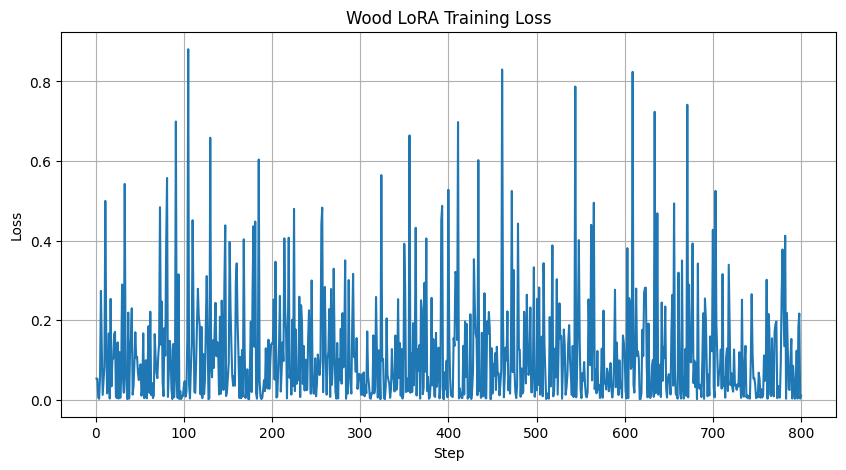

Saved: /content/wood_lora_loss.png


In [21]:
# Plot and save loss
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))
plt.plot(df_loss["step"], df_loss["loss"])
plt.xlabel("Step")
plt.ylabel("Loss")
plt.title("Wood LoRA Training Loss")
plt.grid(True)

LOSS_PLOT_PATH = "/content/wood_lora_loss.png"
plt.savefig(LOSS_PLOT_PATH, dpi=200, bbox_inches="tight")
plt.show()

print("Saved:", LOSS_PLOT_PATH)

In [22]:
#  Save LoRA + logs + plot to Drive
!mkdir -p "{DRIVE_OUTPUT}"
!mkdir -p "{DRIVE_LOGS}"

!cp -r "{KOHYA_OUTPUT}"/* "{DRIVE_OUTPUT}/"
!cp -r "{LOG_DIR}"/* "{DRIVE_LOGS}/"
!cp "{LOSS_PLOT_PATH}" "{DRIVE_LOGS}/wood_lora_loss.png"

print("Saved LoRA to:", DRIVE_OUTPUT)
print("Saved logs to:", DRIVE_LOGS)

Saved LoRA to: /content/drive/MyDrive/wood_LoRa/kohya_output
Saved logs to: /content/drive/MyDrive/wood_LoRa/kohya_logs


Fetching 11 files:   0%|          | 0/11 [00:00<?, ?it/s]

config.json: 0.00B [00:00, ?B/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Some weights of the model checkpoint were not used when initializing CLIPTextModel: 
 ['text_model.embeddings.position_ids']
You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


  0%|          | 0/30 [00:00<?, ?it/s]

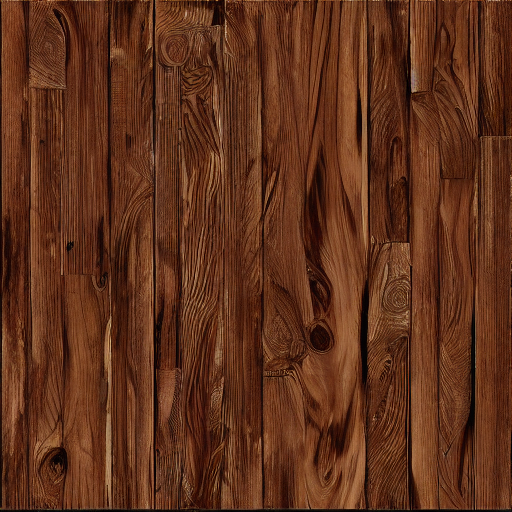

In [23]:
#Test Wood LoRA
import torch
from diffusers import StableDiffusionPipeline

LORA_PATH = f"{KOHYA_OUTPUT}/wood_lora.safetensors"

pipe = StableDiffusionPipeline.from_single_file(
    BASE_MODEL,
    torch_dtype=torch.float16,
    safety_checker=None
).to("cuda")

pipe.load_lora_weights(LORA_PATH)

prompt = (
    "wood floor material, brown medium tone wood, plank wood floor, "
    "straight pattern, horizontal layout, matte finish, visible wood grain, "
    "medium plank width, realistic indoor floor texture, high quality"
)

image = pipe(
    prompt=prompt,
    num_inference_steps=30,
    guidance_scale=7.5
).images[0]

TEST_OUTPUT = "/content/test_wood_lora.png"
image.save(TEST_OUTPUT)
image


# ***test***

In [2]:
!pip install gdown
!gdown https://huggingface.co/runwayml/stable-diffusion-v1-5/resolve/main/v1-5-pruned-emaonly.safetensors \
    -O /content/drive/MyDrive/wood_LoRa/models/v1-5-pruned-emaonly.safetensors

Downloading...
From: https://huggingface.co/runwayml/stable-diffusion-v1-5/resolve/main/v1-5-pruned-emaonly.safetensors
To: /content/drive/MyDrive/wood_LoRa/models/v1-5-pruned-emaonly.safetensors
100% 4.27G/4.27G [01:19<00:00, 53.5MB/s]


In [4]:
!wget -O /content/drive/MyDrive/wood_LoRa/models/sd-inpainting.ckpt \
https://huggingface.co/runwayml/stable-diffusion-inpainting/resolve/main/sd-v1-5-inpainting.ckpt

--2026-04-25 21:58:43--  https://huggingface.co/runwayml/stable-diffusion-inpainting/resolve/main/sd-v1-5-inpainting.ckpt
Resolving huggingface.co (huggingface.co)... 13.35.202.121, 13.35.202.40, 13.35.202.34, ...
Connecting to huggingface.co (huggingface.co)|13.35.202.121|:443... connected.
HTTP request sent, awaiting response... 307 Temporary Redirect
Location: /stable-diffusion-v1-5/stable-diffusion-inpainting/resolve/main/sd-v1-5-inpainting.ckpt [following]
--2026-04-25 21:58:44--  https://huggingface.co/stable-diffusion-v1-5/stable-diffusion-inpainting/resolve/main/sd-v1-5-inpainting.ckpt
Reusing existing connection to huggingface.co:443.
HTTP request sent, awaiting response... 302 Found
Location: https://cas-bridge.xethub.hf.co/xet-bridge-us/66d19a03b003aeb6d1578a57/a04838e83aff1c17ae3526f9902f9dba03505451a7188f81f3bda3ee23c06c4f?X-Amz-Algorithm=AWS4-HMAC-SHA256&X-Amz-Content-Sha256=UNSIGNED-PAYLOAD&X-Amz-Credential=cas%2F20260425%2Fus-east-1%2Fs3%2Faws4_request&X-Amz-Date=202604

In [5]:
!pip install -q git+https://github.com/facebookresearch/segment-anything.git

  Preparing metadata (setup.py) ... done


In [6]:
#Download SAM
import os

SAM_DIR = "/content/drive/MyDrive/wood_LoRA/models/sam"
os.makedirs(SAM_DIR, exist_ok=True)

SAM_PATH = f"{SAM_DIR}/sam_vit_l_0b3195.pth"

if not os.path.exists(SAM_PATH):
    !wget -q https://dl.fbaipublicfiles.com/segment_anything/sam_vit_l_0b3195.pth -O $SAM_PATH

print("SAM_PATH:", SAM_PATH)
print("exists:", os.path.exists(SAM_PATH))

SAM_PATH: /content/drive/MyDrive/wood_LoRA/models/sam/sam_vit_l_0b3195.pth
exists: True


In [27]:
IMAGE_PATH = "/content/drive/MyDrive/test/fb6eb4c9a0adad224faa7fb18e3dfcaa.jpg"
SEGFORMER_PATH = "/content/drive/MyDrive/segformer_room_struct/final"

BASE_MODEL = "/content/drive/MyDrive/wood_LoRa/models/v1-5-pruned-emaonly.safetensors"
CONTROLNET_PATH = "lllyasviel/control_v11f1p_sd15_depth"

LORA_PATH = "/content/drive/MyDrive/wood_LoRa/kohya_output/wood_lora.safetensors"


Unique class ids: [0 1 2]


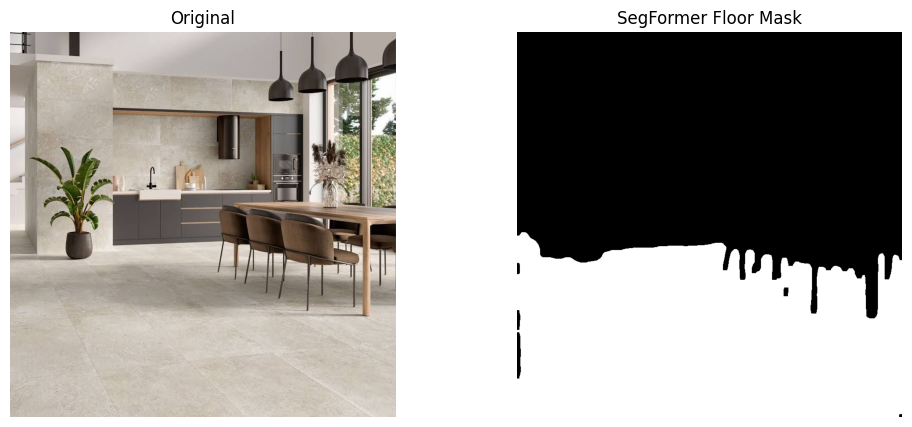

Saved: /content/segformer_floor_mask.png


In [9]:
# SegFormer floor mask
import torch
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import torch.nn.functional as F
from transformers import SegformerImageProcessor, SegformerForSemanticSegmentation

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

image = Image.open(IMAGE_PATH).convert("RGB")
image_np = np.array(image)

processor = SegformerImageProcessor.from_pretrained(SEGFORMER_PATH)
seg_model = SegformerForSemanticSegmentation.from_pretrained(SEGFORMER_PATH).to(DEVICE)
seg_model.eval()

inputs = processor(images=image, return_tensors="pt").to(DEVICE)

with torch.no_grad():
    outputs = seg_model(**inputs)

logits = outputs.logits

upsampled_logits = F.interpolate(
    logits,
    size=image.size[::-1],
    mode="bilinear",
    align_corners=False
)

pred = upsampled_logits.argmax(dim=1)[0].cpu().numpy()

print("Unique class ids:", np.unique(pred))


FLOOR_ID = 2

floor_mask = (pred == FLOOR_ID).astype(np.uint8) * 255

kernel = np.ones((5, 5), np.uint8)
floor_mask = cv2.morphologyEx(floor_mask, cv2.MORPH_OPEN, kernel, iterations=1)
floor_mask = cv2.morphologyEx(floor_mask, cv2.MORPH_CLOSE, kernel, iterations=2)

SEG_MASK_PATH = "/content/segformer_floor_mask.png"
Image.fromarray(floor_mask).save(SEG_MASK_PATH)

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(image_np)
plt.title("Original")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(floor_mask, cmap="gray")
plt.title("SegFormer Floor Mask")
plt.axis("off")
plt.show()

print("Saved:", SEG_MASK_PATH)

In [10]:
print("IMAGE_PATH:", IMAGE_PATH)
print("Exists:", os.path.exists(IMAGE_PATH))

image = Image.open(IMAGE_PATH).convert("RGB")
image_np = np.array(image)

print("image_np shape:", image_np.shape)

IMAGE_PATH: /content/drive/MyDrive/test/fb6eb4c9a0adad224faa7fb18e3dfcaa.jpg
Exists: True
image_np shape: (800, 800, 3)


In [35]:
def refine_floor_mask_with_sam(
    image_np,
    floor_mask,
    SAM_PATH,
    device="cuda",
    save_path="/content/final_inpaint_mask.png",
    show=True
):
    import cv2
    import numpy as np
    from PIL import Image
    import matplotlib.pyplot as plt
    from segment_anything import sam_model_registry, SamPredictor
    import torch

    DEVICE = device if torch.cuda.is_available() else "cpu"

    floor_mask = (floor_mask > 127).astype(np.uint8) * 255

    contours, _ = cv2.findContours(
        floor_mask,
        cv2.RETR_EXTERNAL,
        cv2.CHAIN_APPROX_SIMPLE
    )

    if len(contours) == 0:
        raise ValueError("No contours found in floor mask..")

    largest_contour = max(contours, key=cv2.contourArea)
    x, y, w, h = cv2.boundingRect(largest_contour)

    pad = 10
    x1 = max(0, x - pad)
    y1 = max(0, y - pad)
    x2 = min(image_np.shape[1] - 1, x + w + pad)
    y2 = min(image_np.shape[0] - 1, y + h + pad)

    input_box = np.array([x1, y1, x2, y2])

    sam = sam_model_registry["vit_l"](checkpoint=SAM_PATH).to(DEVICE)
    sam.eval()

    predictor = SamPredictor(sam)
    predictor.set_image(image_np)

    masks, scores, logits = predictor.predict(
        box=input_box,
        multimask_output=True
    )

    best_idx = int(np.argmax(scores))
    sam_mask = masks[best_idx].astype(np.uint8) * 255

    final_mask = ((sam_mask > 0) & (floor_mask > 0)).astype(np.uint8) * 255

    kernel = np.ones((3, 3), np.uint8)
    final_mask = cv2.morphologyEx(final_mask, cv2.MORPH_OPEN, kernel, iterations=1)
    final_mask = cv2.morphologyEx(final_mask, cv2.MORPH_CLOSE, kernel, iterations=1)

    Image.fromarray(final_mask).save(save_path)

    if show:
        overlay = image_np.copy()
        overlay[final_mask > 0] = (
            0.6 * overlay[final_mask > 0] + 0.4 * np.array([255, 0, 0])
        ).astype(np.uint8)

        boxed = image_np.copy()
        cv2.rectangle(boxed, (x1, y1), (x2, y2), (0, 255, 0), 2)

        plt.figure(figsize=(18, 5))

        plt.subplot(1, 4, 1)
        plt.imshow(image_np)
        plt.title("Original")
        plt.axis("off")

        plt.subplot(1, 4, 2)
        plt.imshow(floor_mask, cmap="gray")
        plt.title("SegFormer Floor Mask")
        plt.axis("off")

        plt.subplot(1, 4, 3)
        plt.imshow(boxed)
        plt.title("SAM Box")
        plt.axis("off")

        plt.subplot(1, 4, 4)
        plt.imshow(overlay)
        plt.title("Final SAM Mask")
        plt.axis("off")

        plt.show()

    return final_mask, save_path



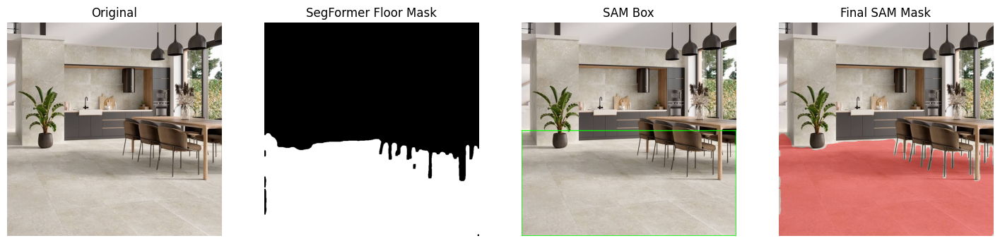

In [37]:
final_mask, FINAL_MASK_PATH = refine_floor_mask_with_sam(
    image_np=image_np,
    floor_mask=floor_mask,
    SAM_PATH=SAM_PATH,
    device=DEVICE,
    save_path="/content/final_inpaint_mask_fb6.png",
    show=True
)

mask_image = Image.open(FINAL_MASK_PATH).convert("L").resize(
    init_image.size,
    Image.NEAREST
)

In [12]:
!pip install -q controlnet_aux

/usr/local/lib/python3.12/dist-packages/controlnet_aux/mediapipe_face/mediapipe_face_common.py:7: UserWarning: The module 'mediapipe' is not installed. The package will have limited functionality. Please install it using the command: pip install 'mediapipe'
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/timm/models/layers/__init__.py:49: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)
/usr/local/lib/python3.12/dist-packages/timm/models/registry.py:4: FutureWarning: Importing from timm.models.registry is deprecated, please import via timm.models
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.models", FutureWarning)
/usr/local/lib/python3.12/dist-packages/controlnet_aux/segment_anything/modeling/tiny_vit_sam.py:654: UserWarning: Overwriting tiny_vit_5m_224 in registry with controlnet_aux.segmen

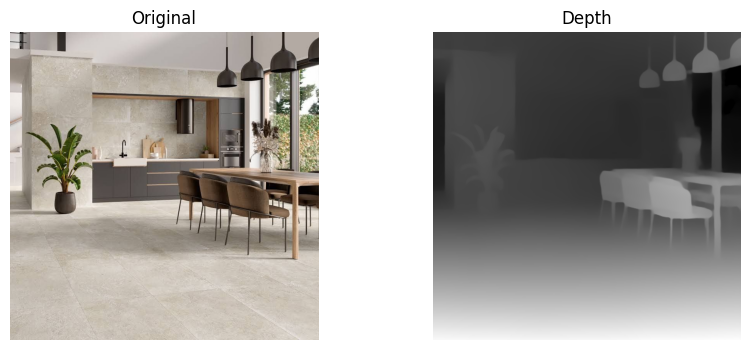

Saved: /content/depth_control.png


In [13]:
from controlnet_aux import MidasDetector
from PIL import Image
import numpy as np
import cv2
import matplotlib.pyplot as plt

image = Image.open(IMAGE_PATH).convert("RGB")

midas = MidasDetector.from_pretrained("lllyasviel/Annotators")
depth_img = midas(image).resize(image.size)

DEPTH_PATH = "/content/depth_control.png"
depth_img.save(DEPTH_PATH)

plt.figure(figsize=(10,4))
plt.subplot(1,2,1)
plt.imshow(image)
plt.title("Original")
plt.axis("off")

plt.subplot(1,2,2)
plt.imshow(depth_img)
plt.title("Depth")
plt.axis("off")
plt.show()

print("Saved:", DEPTH_PATH)

In [14]:
!pip install -q diffusers transformers accelerate safetensors xformers

In [28]:
import os
import torch
from diffusers import ControlNetModel, StableDiffusionControlNetInpaintPipeline, UniPCMultistepScheduler
from PIL import Image

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
DTYPE = torch.float16 if DEVICE == "cuda" else torch.float32

mask_img = Image.open(FINAL_MASK_PATH).convert("L").resize(image.size, Image.NEAREST)
depth_img = Image.open(DEPTH_PATH).convert("RGB").resize(image.size)

controlnet = ControlNetModel.from_pretrained(
    CONTROLNET_PATH,
    torch_dtype=DTYPE
)

pipe = StableDiffusionControlNetInpaintPipeline.from_single_file(
    BASE_MODEL,
    controlnet=controlnet,
    torch_dtype=DTYPE,
    safety_checker=None,
    requires_safety_checker=False
).to(DEVICE)

pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)

assert os.path.exists(LORA_PATH), f"LoRA file not found: {LORA_PATH}"

lora_dir = os.path.dirname(LORA_PATH)
lora_file = os.path.basename(LORA_PATH)

pipe.load_lora_weights(
    lora_dir,
    weight_name=lora_file,
    adapter_name="wood"
)

pipe.set_adapters(["wood"], adapter_weights=[0.8])

try:
    pipe.enable_xformers_memory_efficient_attention()
except Exception:
    pipe.enable_attention_slicing()

Fetching 11 files:   0%|          | 0/11 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Some weights of the model checkpoint were not used when initializing CLIPTextModel: 
 ['text_model.embeddings.position_ids']


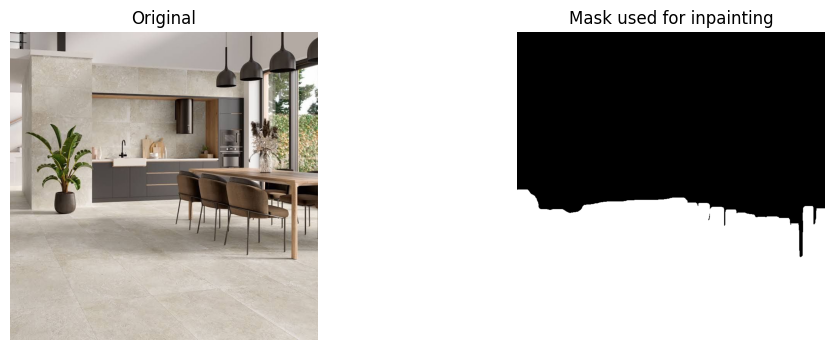

Will test:
wood_lora-step00000200.safetensors
wood_lora-step00000400.safetensors
wood_lora-step00000600.safetensors
wood_lora-step00000800.safetensors
wood_lora.safetensors
PROMPT:
wood floor, brown wood flooring, (dark brown walnut wood floor:1.3), (subtle chevron pattern:1.2), (small scale wood planks:1.3), (fine wood grain texture:1.3), natural realistic hardwood floor, matte finish, no repeating pattern, no tiling, seamless wood floor, photorealistic interior, natural lighting, soft shadows, replace entire floor, preserve furniture, preserve walls
Running: wood_lora-step00000200.safetensors


The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft shadows , replace entire floor , preserve furniture , preserve walls']


  0%|          | 0/35 [00:00<?, ?it/s]

Running: wood_lora-step00000400.safetensors


The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft shadows , replace entire floor , preserve furniture , preserve walls']


  0%|          | 0/35 [00:00<?, ?it/s]

Running: wood_lora-step00000600.safetensors


The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft shadows , replace entire floor , preserve furniture , preserve walls']


  0%|          | 0/35 [00:00<?, ?it/s]

Running: wood_lora-step00000800.safetensors


The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft shadows , replace entire floor , preserve furniture , preserve walls']


  0%|          | 0/35 [00:00<?, ?it/s]

Running: wood_lora.safetensors


The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['soft shadows , replace entire floor , preserve furniture , preserve walls']


  0%|          | 0/35 [00:00<?, ?it/s]

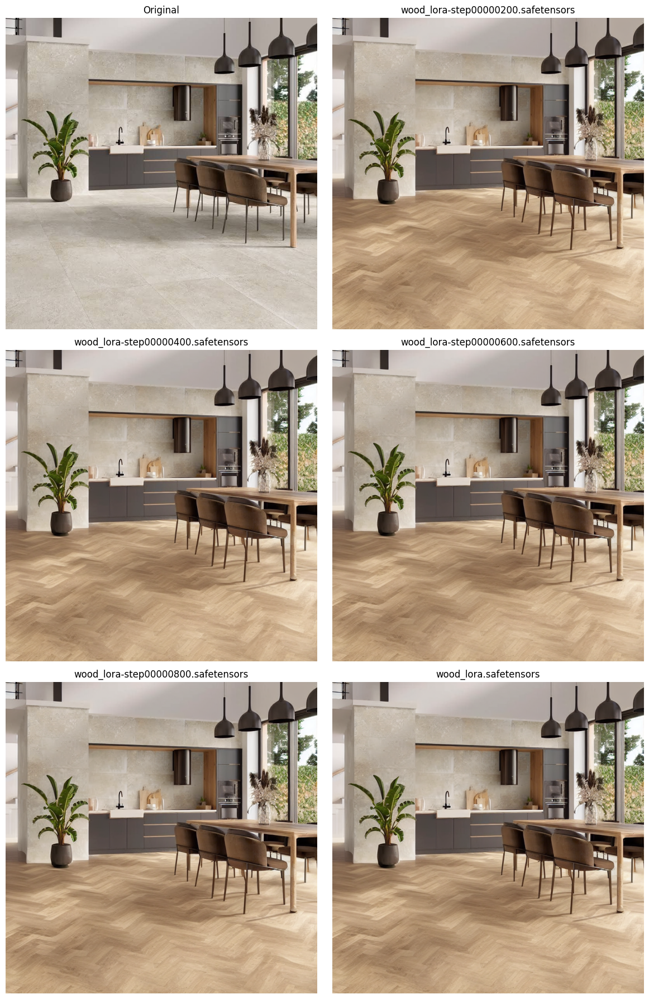

In [33]:
import os, glob, torch, math
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
import cv2

CHECKPOINT_DIR = "/content/drive/MyDrive/wood_LoRa/kohya_output"
OUTPUT_PREVIEW_DIR = "/content/drive/MyDrive/wood_LoRa/previews_dark_brown"
os.makedirs(OUTPUT_PREVIEW_DIR, exist_ok=True)

checkpoint_paths = sorted([
    p for p in glob.glob(CHECKPOINT_DIR + "/*.safetensors")
    if "debug" not in os.path.basename(p)
])

init_image = Image.open(IMAGE_PATH).convert("RGB")

mask_image = Image.open(FINAL_MASK_PATH).convert("L").resize(init_image.size, Image.NEAREST)
mask_np = np.array(mask_image)
mask_np = (mask_np > 20).astype(np.uint8) * 255

kernel = np.ones((9, 9), np.uint8)
mask_np = cv2.dilate(mask_np, kernel, iterations=2)

mask_image = Image.fromarray(mask_np)

depth_image = Image.open(DEPTH_PATH).convert("RGB").resize(init_image.size)

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.imshow(init_image)
plt.title("Original")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(mask_image, cmap="gray")
plt.title("Mask used for inpainting")
plt.axis("off")
plt.show()

PROMPT = (
    "wood floor, brown wood flooring, "
    "(dark brown walnut wood floor:1.3), "
    "(subtle chevron pattern:1.2), "
    "(small scale wood planks:1.3), "
    "(fine wood grain texture:1.3), "
    "natural realistic hardwood floor, matte finish, "
    "no repeating pattern, no tiling, seamless wood floor, "
    "photorealistic interior, natural lighting, soft shadows, "
    "replace entire floor, preserve furniture, preserve walls"
)

NEGATIVE_PROMPT = (
    "large pattern, oversized planks, repeating pattern, tiled texture, texture repetition, "
    "fake wood, plastic floor, high contrast patches, noisy texture, "
    "ceramic, marble, stone, concrete, terrazzo, "
    "distorted floor, warped planks, broken perspective"
)

print("Will test:")
for p in checkpoint_paths:
    print(os.path.basename(p))

print("PROMPT:")
print(PROMPT)

results = []

for lora_path in checkpoint_paths:
    ckpt_name = os.path.basename(lora_path)
    print("Running:", ckpt_name)

    try:
        pipe.unload_lora_weights()
    except Exception:
        pass

    pipe.load_lora_weights(
        os.path.dirname(lora_path),
        weight_name=os.path.basename(lora_path),
        adapter_name="wood"
    )

    pipe.set_adapters(["wood"], adapter_weights=[0.9])

    generator = torch.Generator(device=DEVICE).manual_seed(123)

    out = pipe(
        prompt=PROMPT,
        negative_prompt=NEGATIVE_PROMPT,
        image=init_image,
        mask_image=mask_image,
        control_image=depth_image,
        strength=0.88,
        num_inference_steps=40,
        guidance_scale=8.5,
        controlnet_conditioning_scale=0.65,
        generator=generator
    ).images[0]

    save_path = os.path.join(
        OUTPUT_PREVIEW_DIR,
        ckpt_name.replace(".safetensors", "_dark_brown.png")
    )
    out.save(save_path)

    results.append((ckpt_name, out))

cols = 2
rows = math.ceil((len(results) + 1) / cols)

plt.figure(figsize=(12, 6 * rows))

plt.subplot(rows, cols, 1)
plt.imshow(init_image)
plt.title("Original")
plt.axis("off")

for i, (name, img) in enumerate(results, start=2):
    plt.subplot(rows, cols, i)
    plt.imshow(img)
    plt.title(name)
    plt.axis("off")

plt.tight_layout()
plt.show()

Unique class ids: [0 1 2]


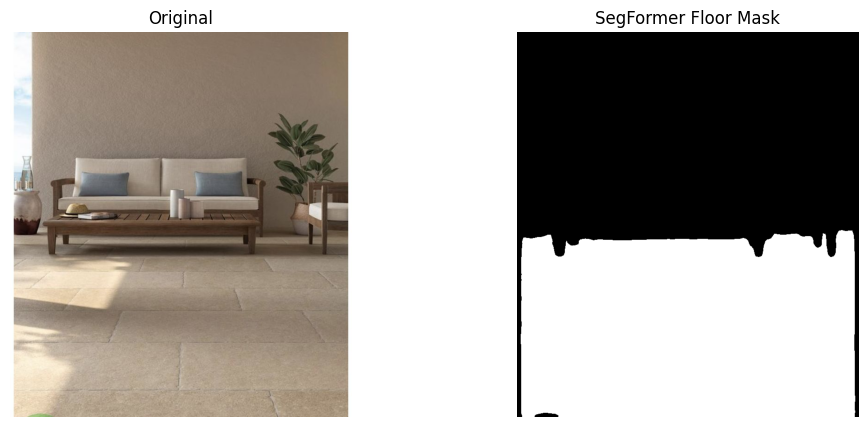

In [38]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from transformers import SegformerImageProcessor, SegformerForSemanticSegmentation

NEW_IMAGE_PATH = "/content/drive/MyDrive/test/1b4ecb54d504e46d135e4c4902779462.jpg"
SEGFORMER_PATH = "/content/drive/MyDrive/segformer_room_struct/final"

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

new_init_image = Image.open(NEW_IMAGE_PATH).convert("RGB")
image_np = np.array(new_init_image)

processor = SegformerImageProcessor.from_pretrained(SEGFORMER_PATH)
seg_model = SegformerForSemanticSegmentation.from_pretrained(SEGFORMER_PATH).to(DEVICE)
seg_model.eval()

inputs = processor(images=new_init_image, return_tensors="pt").to(DEVICE)

with torch.no_grad():
    outputs = seg_model(**inputs)

logits = outputs.logits

upsampled_logits = torch.nn.functional.interpolate(
    logits,
    size=new_init_image.size[::-1],
    mode="bilinear",
    align_corners=False
)

pred_mask = upsampled_logits.argmax(dim=1)[0].detach().cpu().numpy()

print("Unique class ids:", np.unique(pred_mask))

FLOOR_CLASS_ID = 2
floor_mask = (pred_mask == FLOOR_CLASS_ID).astype(np.uint8) * 255

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(new_init_image)
plt.title("Original")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(floor_mask, cmap="gray")
plt.title("SegFormer Floor Mask")
plt.axis("off")

plt.show()

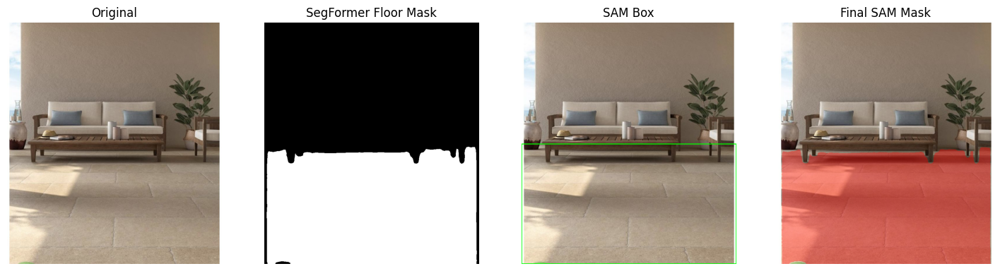

Saved: /content/final_inpaint_mask_new_image.png


In [39]:
final_mask, FINAL_MASK_PATH = refine_floor_mask_with_sam(
    image_np=image_np,
    floor_mask=floor_mask,
    SAM_PATH=SAM_PATH,
    device=DEVICE,
    save_path="/content/final_inpaint_mask_new_image.png",
    show=True
)

mask_image = Image.open(FINAL_MASK_PATH).convert("L").resize(
    new_init_image.size,
    Image.NEAREST
)

print("Saved:", FINAL_MASK_PATH)

/usr/local/lib/python3.12/dist-packages/timm/models/_factory.py:138: UserWarning: Mapping deprecated model name vit_base_resnet50_384 to current vit_base_r50_s16_384.orig_in21k_ft_in1k.
  model = create_fn(
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', natural lighting , soft shadows , preserve furniture , preserve walls , preserve room structure']


  0%|          | 0/36 [00:00<?, ?it/s]

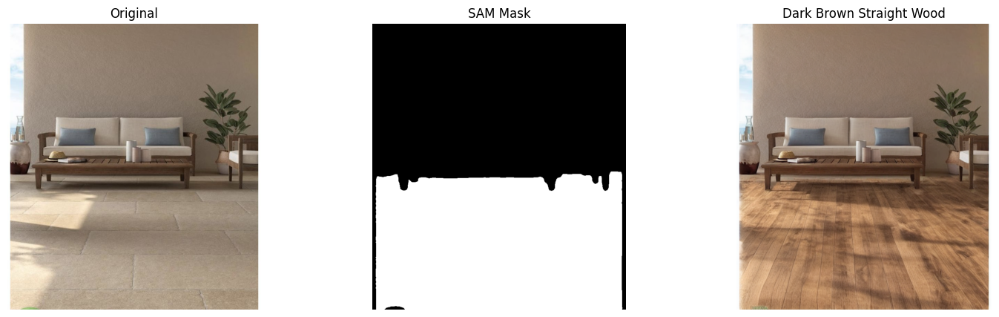

Depth saved: /content/drive/MyDrive/wood_LoRa/single_results/new_depth_control.png
Result saved: /content/drive/MyDrive/wood_LoRa/single_results/new_image_dark_brown_straight_wood.png


In [40]:
from controlnet_aux import MidasDetector
from PIL import Image
import torch, os
import matplotlib.pyplot as plt

NEW_LORA_PATH = "/content/drive/MyDrive/wood_LoRa/kohya_output/wood_lora-step00000400.safetensors"

OUTPUT_DIR = "/content/drive/MyDrive/wood_LoRa/single_results"
os.makedirs(OUTPUT_DIR, exist_ok=True)

midas = MidasDetector.from_pretrained("lllyasviel/Annotators")
new_depth_image = midas(new_init_image).resize(new_init_image.size)

NEW_DEPTH_PATH = os.path.join(OUTPUT_DIR, "new_depth_control.png")
new_depth_image.save(NEW_DEPTH_PATH)

mask_image = Image.open(FINAL_MASK_PATH).convert("L").resize(
    new_init_image.size,
    Image.NEAREST
)

try:
    pipe.unload_lora_weights()
except Exception:
    pass

pipe.load_lora_weights(
    os.path.dirname(NEW_LORA_PATH),
    weight_name=os.path.basename(NEW_LORA_PATH),
    adapter_name="wood"
)

pipe.set_adapters(["wood"], adapter_weights=[1.05])

PROMPT = (
    "wood floor, dark brown wood flooring, "
    "(dark brown walnut straight wood floor:1.3), "
    "(straight horizontal wood planks:1.35), "
    "(wide linear planks:1.25), "
    "(visible fine wood grain texture:1.25), "
    "matte realistic hardwood floor, seamless floor, "
    "replace entire floor with dark brown straight wood flooring, "
    "realistic perspective, natural lighting, soft shadows, "
    "preserve furniture, preserve walls, preserve room structure"
)

NEGATIVE_PROMPT = (
    "chevron pattern, herringbone pattern, diagonal planks, V shaped planks, parquet pattern, "
    "light wood, beige wood, pale floor, washed out color, "
    "ceramic tile, marble, stone, concrete, terrazzo, carpet, rug, "
    "large exaggerated wood grain, repeating texture, warped planks, distorted floor, "
    "changed furniture, changed walls, extra objects, low quality, artifacts"
)

generator = torch.Generator(device=DEVICE).manual_seed(42)

new_wood_result = pipe(
    prompt=PROMPT,
    negative_prompt=NEGATIVE_PROMPT,
    image=new_init_image,
    mask_image=mask_image,
    control_image=new_depth_image,
    strength=0.90,
    num_inference_steps=40,
    guidance_scale=9.0,
    controlnet_conditioning_scale=0.60,
    generator=generator
).images[0]

NEW_OUTPUT_PATH = os.path.join(OUTPUT_DIR, "new_image_dark_brown_straight_wood.png")
new_wood_result.save(NEW_OUTPUT_PATH)

plt.figure(figsize=(18, 5))

plt.subplot(1, 3, 1)
plt.imshow(new_init_image)
plt.title("Original")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(mask_image, cmap="gray")
plt.title("SAM Mask")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(new_wood_result)
plt.title("Dark Brown Straight Wood")
plt.axis("off")

plt.show()

print("Depth saved:", NEW_DEPTH_PATH)
print("Result saved:", NEW_OUTPUT_PATH)